<a href="https://colab.research.google.com/github/Dbms084/chest-xray-pneumonia-detection/blob/main/01_basline_cnn_chest_pneumonia_prediction%2602_improved_cnn.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import files
files.upload()

Saving kaggle.json.txt to kaggle.json.txt


{'kaggle.json.txt': b'{\r\n  "username": "debosmitamajumdar08",\r\n  "key": "KGAT_45ea354af47028cc6087d5dc8932b25b"\r\n}\r\n'}

# Baseline CNN for Pneumonia Detection

**Objective:**  
To build and understand a baseline convolutional neural network for classifying chest X-ray images.


In [2]:
!mv "kaggle.json.txt" kaggle.json

In [3]:
!ls

kaggle.json  sample_data


In [4]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json


In [5]:
!kaggle datasets list


ref                                                              title                                                  size  lastUpdated                 downloadCount  voteCount  usabilityRating  
---------------------------------------------------------------  -----------------------------------------------  ----------  --------------------------  -------------  ---------  ---------------  
neurocipher/heartdisease                                         Heart Disease                                          3491  2025-12-11 15:29:14.327000           2114         95  1.0              
neurocipher/student-performance                                  Student Performance                                   49705  2025-12-12 12:06:28.973000           1261         70  1.0              
wardabilal/spotify-global-music-dataset-20092025                 Spotify Global Music Dataset (2009–2025)            1289021  2025-11-11 09:43:05.933000          16387        440  1.0              
pranavshin

In [6]:
!kaggle datasets download -d paultimothymooney/chest-xray-pneumonia
!unzip chest-xray-pneumonia.zip


Streaming output truncated to the last 5000 lines.
  inflating: chest_xray/train/NORMAL/IM-0435-0001-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0435-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0437-0001-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0437-0001-0002.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0437-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0438-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0439-0001-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0439-0001-0002.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0439-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0440-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0441-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0442-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0444-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0445-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0446-0001.jpeg  
  inflating: chest_xray/train/NORMAL/IM-0447-0001.jpeg  
  inflating:

In [7]:
import tensorflow as tf
import numpy as np
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import Sequential
import matplotlib.pyplot as plt

In [8]:
import PIL
from PIL import Image
import os

In [9]:
base_dir = "/content/chest_xray/chest_xray"

In [10]:
normal_dir = os.path.join(base_dir,"train/NORMAL")
pneumonia_dir = os.path.join(base_dir,"train/PNEUMONIA")

In [12]:
print("Normal images: ",len(os.listdir(normal_dir)))
print("Pneumonia images: ",len(os.listdir(pneumonia_dir))) #more number of pneumonia images

Normal images:  1342
Pneumonia images:  3876


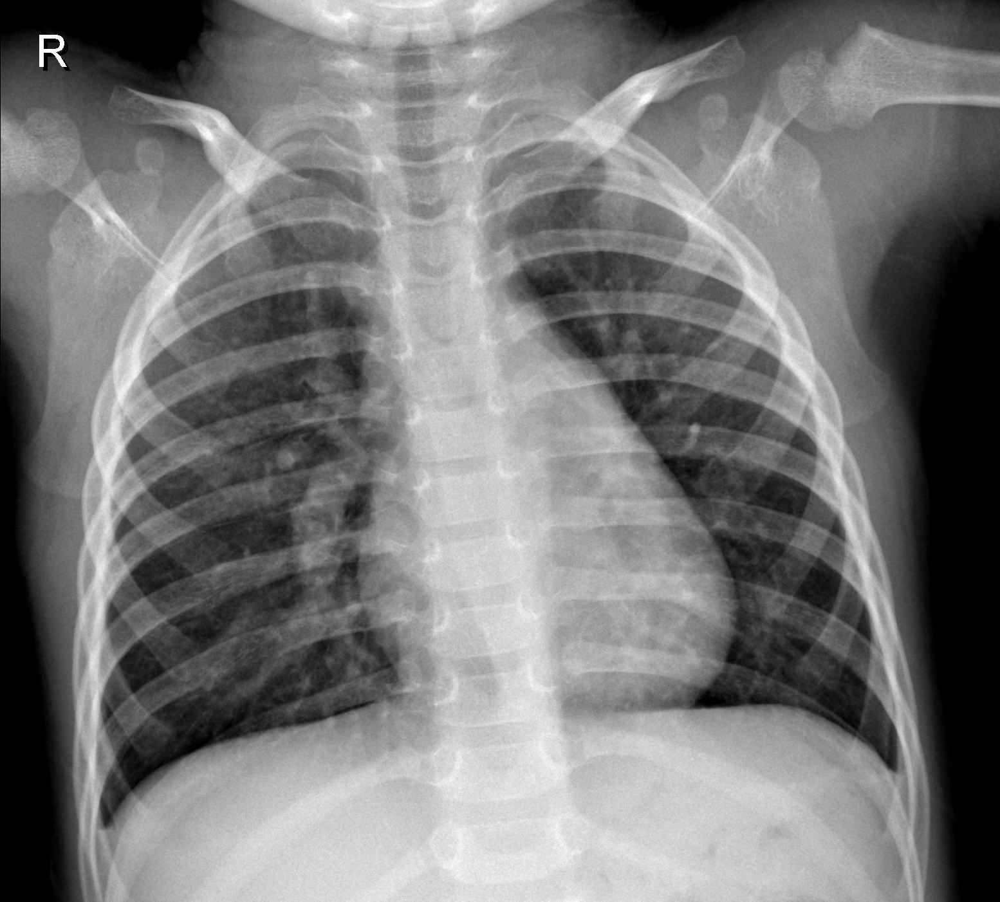

In [13]:
normal_image_path = os.path.join(normal_dir,os.listdir(normal_dir)[0])
normal_img = Image.open(normal_image_path)
normal_img


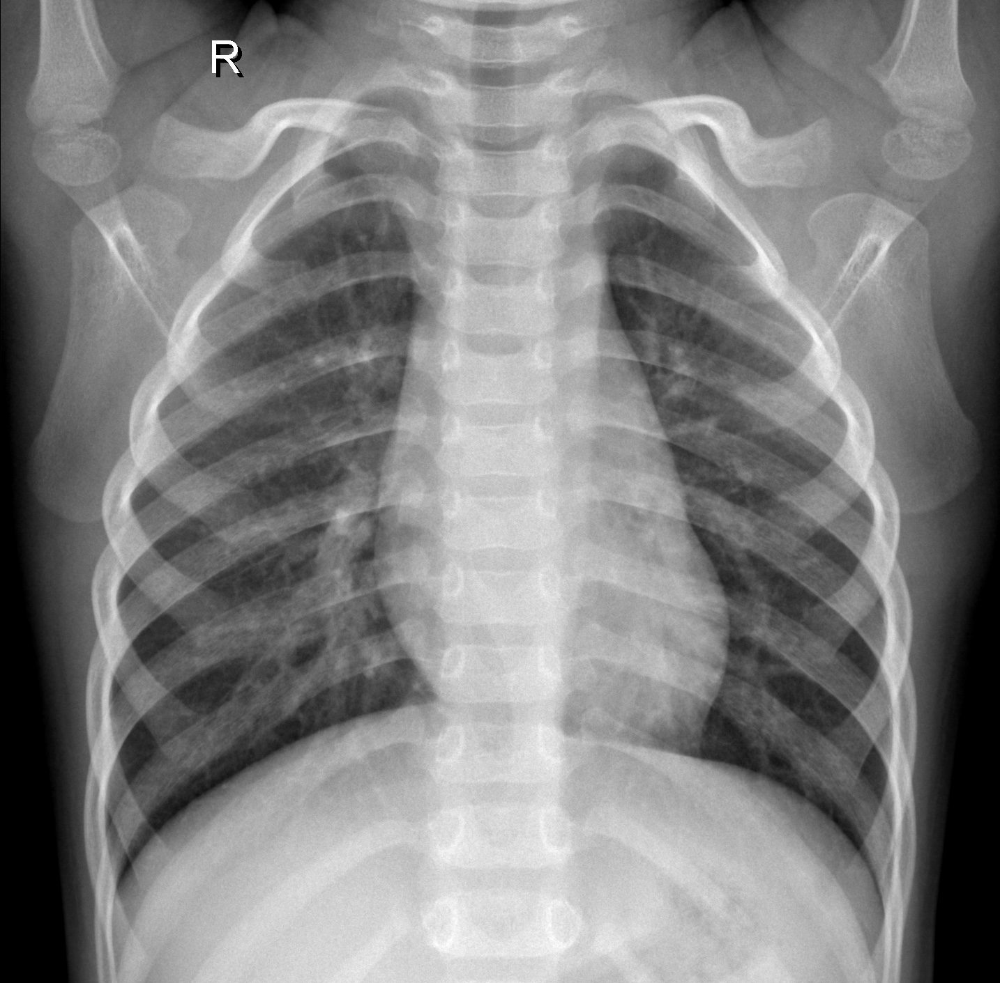

In [14]:
normal_image_path = os.path.join(normal_dir,os.listdir(normal_dir)[1])
normal_img = Image.open(normal_image_path)
normal_img

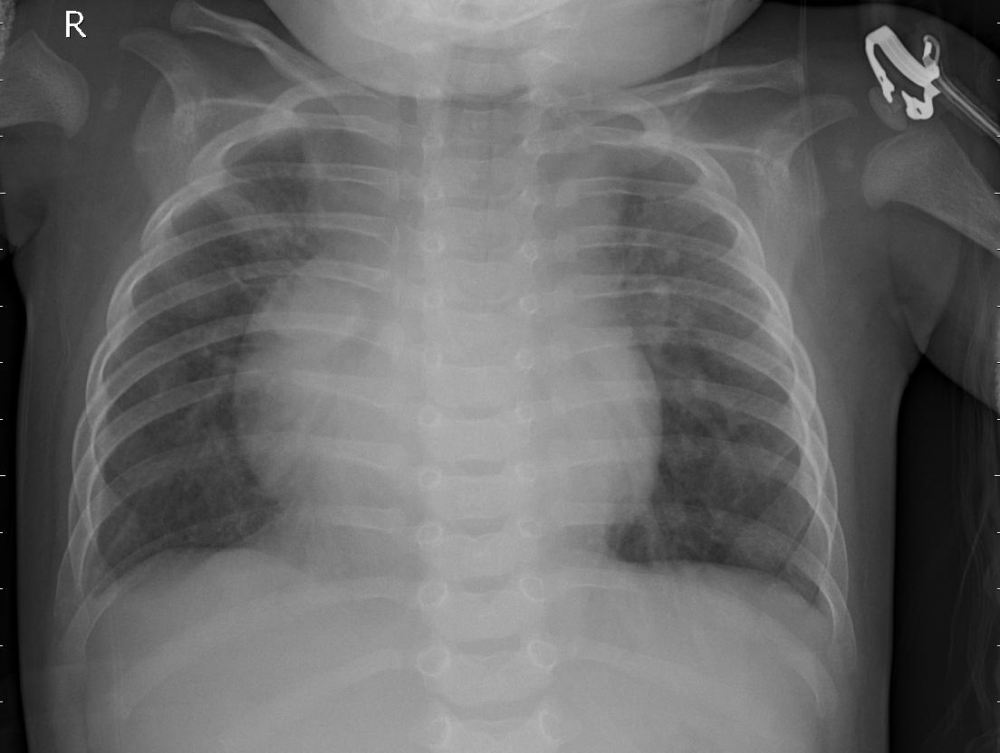

In [15]:
pneumonia_image_path = os.path.join(pneumonia_dir,os.listdir(pneumonia_dir)[0])
pneumonia_img = Image.open(pneumonia_image_path)
pneumonia_img

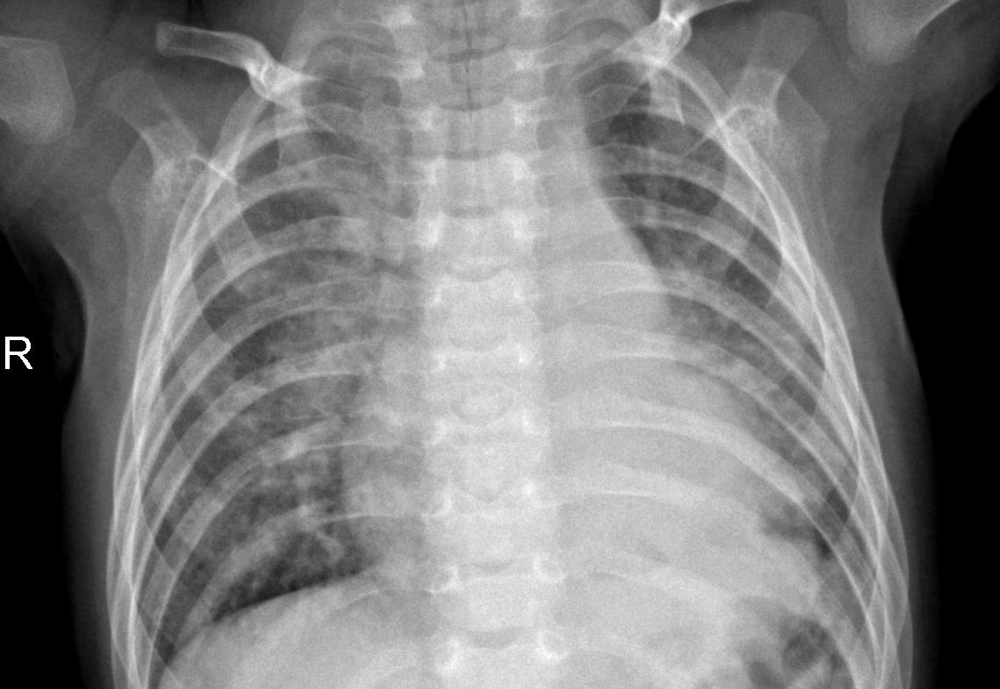

In [16]:
pneumonia_image_path = os.path.join(pneumonia_dir,os.listdir(pneumonia_dir)[1])
pneumonia_img = Image.open(pneumonia_image_path)
pneumonia_img

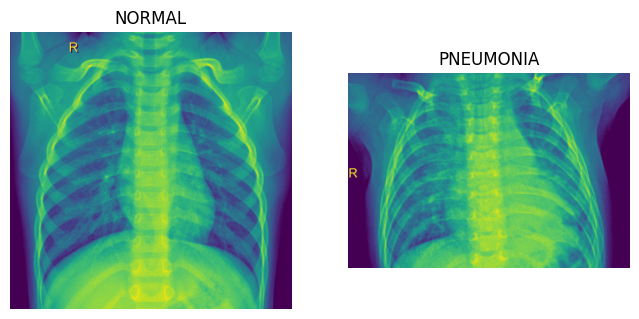

In [18]:
plt.figure(figsize=(8,8))
plt.subplot(1,2,1)
plt.imshow(normal_img)
plt.title("NORMAL")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(pneumonia_img)
plt.title("PNEUMONIA")
plt.axis("off")
plt.show()

In [19]:
print("Normal image size:", normal_img.size)
print("Pneumonia image size:", pneumonia_img.size)
print("Image mode:", normal_img.mode)


Normal image size: (1434, 1411)
Pneumonia image size: (1140, 786)
Image mode: L


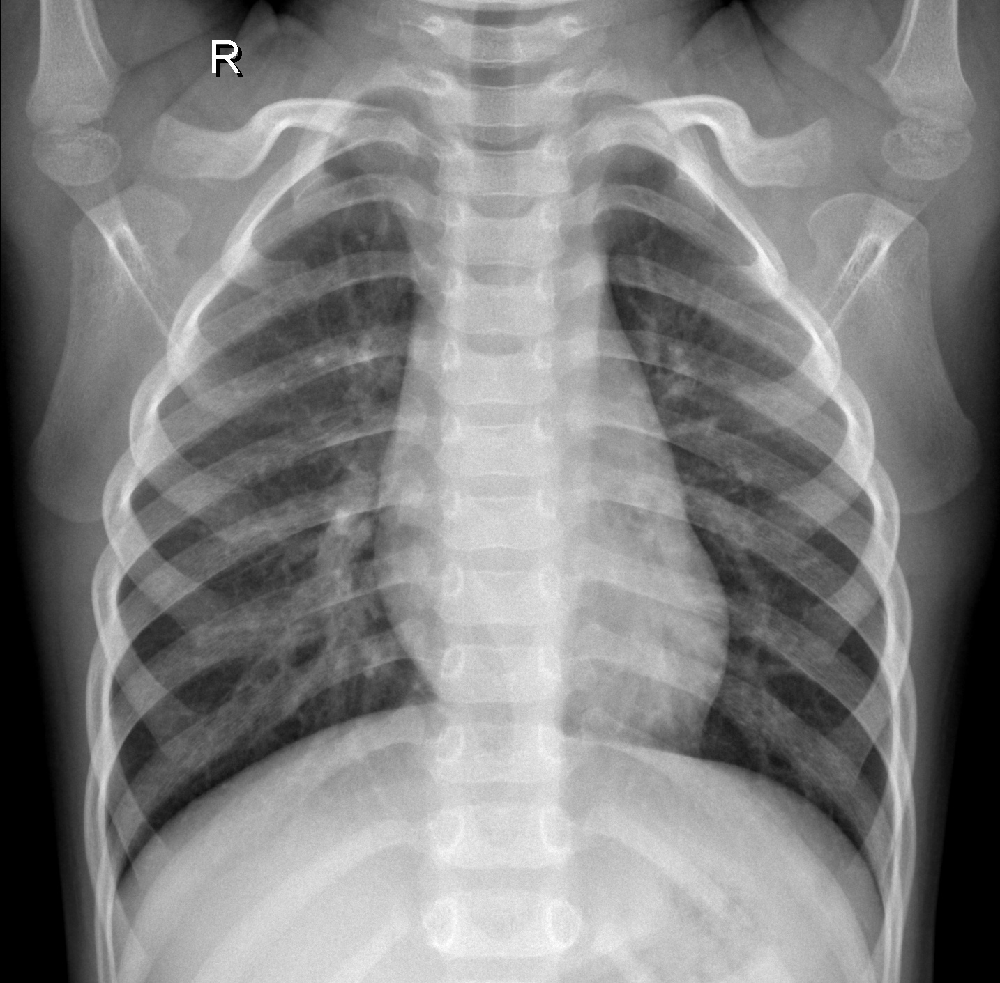

In [21]:
normal_img_rgb = normal_img.convert("RGB")
normal_img_rgb

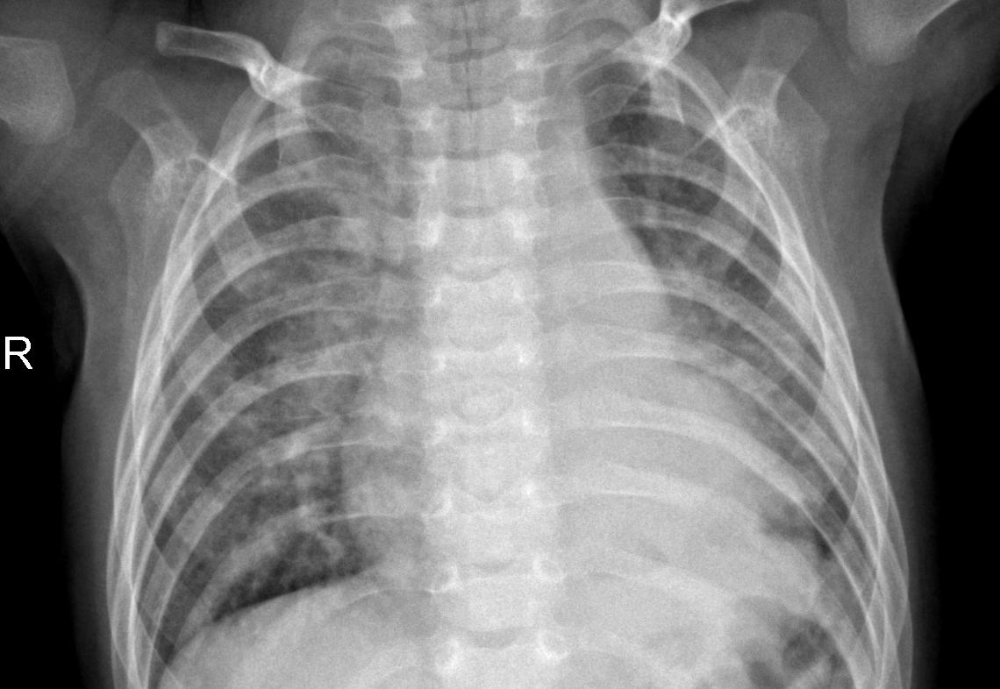

In [22]:
pneumonia_img_rgb = pneumonia_img.convert("RGB")
pneumonia_img_rgb

## Define dataset paths

In [30]:
data_dir = "/content/chest_xray/chest_xray"
train_dir = os.path.join(data_dir,"train")
test_dir = os.path.join(data_dir,"test")
val_dir = os.path.join(data_dir,"val")

In [32]:
!ls "/content/chest_xray/chest_xray"

test  train  val


In [24]:
img_height=180
img_width=180
batch_size=32

Load training dataset


In [44]:
train_ds = tf.keras.utils.image_dataset_from_directory(
    train_dir,
    image_size=(img_height,img_width),
    batch_size=batch_size
)

Found 5216 files belonging to 2 classes.


Load validation dataset

In [45]:

val_ds = tf.keras.utils.image_dataset_from_directory(
    val_dir,
    image_size=(img_height,img_width),
    batch_size=batch_size
)

Found 16 files belonging to 2 classes.


In [46]:
class_names = train_ds.class_names
print(class_names)

['NORMAL', 'PNEUMONIA']


In [47]:
for images, labels in train_ds.take(1):
    print("Image batch shape:", images.shape)
    print("Label batch shape:", labels.shape)
    print("Labels:", labels.numpy())


Image batch shape: (32, 180, 180, 3)
Label batch shape: (32,)
Labels: [1 0 1 1 1 0 1 1 1 1 0 0 1 1 1 1 1 1 1 1 0 0 1 1 1 1 0 1 0 0 1 1]


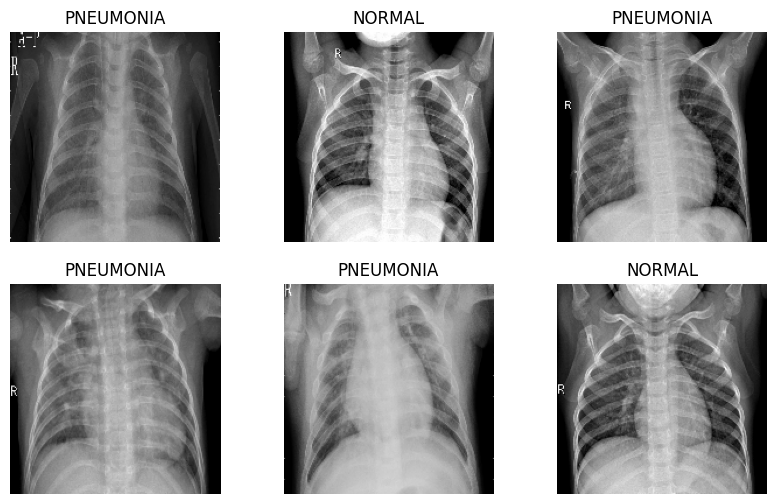

In [48]:
plt.figure(figsize=(10,6))
for i in range(6):
    plt.subplot(2,3,i+1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")
plt.show()


# Improve data pipeline

In [49]:
AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)


Build the baseline CNN

In [50]:
from tensorflow.keras import models

In [51]:
num_classes = len(class_names)
model = models.Sequential([
    layers.Rescaling(1./255,input_shape=(img_height,img_width,3)),
    layers.Conv2D(16,3,padding='same',activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32,3,padding='same',activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64,3,padding='same',activation='relu'),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(128,activation='relu'),
    layers.Dense(num_classes)

])

In [52]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_1 (Rescaling)         │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 180, 180, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 90, 90, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 90, 90, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 45, 45, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 45, 45, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 22, 22, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 30976)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │     3,965,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 2)              │           258 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,988,898 (15.22 MB)

 Trainable params: 3,988,898 (15.22 MB)

 Non-trainable params: 0 (0.00 B)

In [53]:
model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['accuracy']
)

In [54]:
epochs = 10
history=model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=epochs
)

Epoch 1/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - accuracy: 0.8535 - loss: 0.3797 - val_accuracy: 0.6875 - val_loss: 0.5769
Epoch 2/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - accuracy: 0.9578 - loss: 0.1163 - val_accuracy: 0.7500 - val_loss: 0.3807
Epoch 3/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - accuracy: 0.9735 - loss: 0.0747 - val_accuracy: 1.0000 - val_loss: 0.0741
Epoch 4/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - accuracy: 0.9773 - loss: 0.0577 - val_accuracy: 0.7500 - val_loss: 0.4252
Epoch 5/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 5s 18ms/step - accuracy: 0.9882 - loss: 0.0342 - val_accuracy: 1.0000 - val_loss: 0.0798
Epoch 6/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - accuracy: 0.9849 - loss: 0.0399 - val_accuracy: 1.0000 - val_loss: 0.0393
Epoch 7/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - accuracy: 0.9877 - loss: 0.0287 - val_accuracy: 1.0000 - val_loss: 0.0071
Epoch 8/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - accuracy: 0.9957 - loss: 0.0133 - val_acc

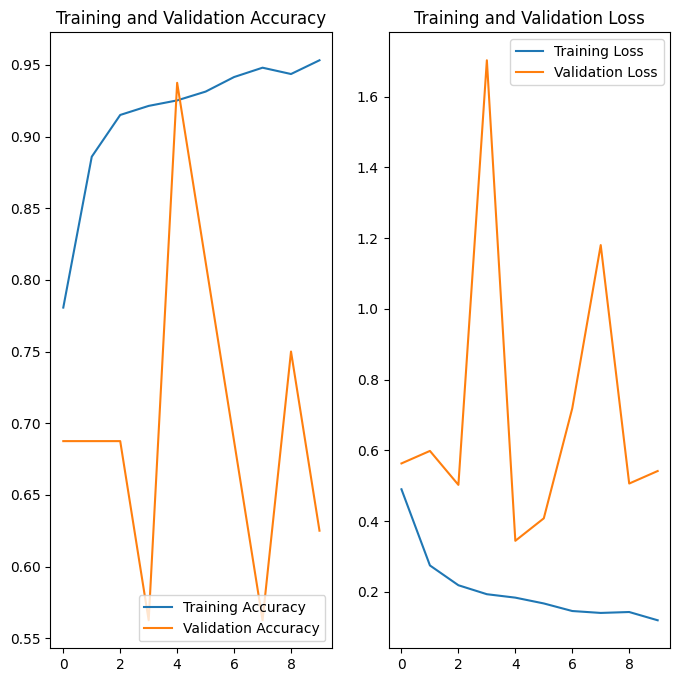

In [74]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.savefig("results/plots/accuracy_baseline.png")
plt.show()

Evaluate on test set

In [56]:
test_dir = "/content/chest_xray/test"
test_ds = tf.keras.utils.image_dataset_from_directory(
    test_dir,
    image_size=(img_height,img_width),
    batch_size=batch_size
)

Found 624 files belonging to 2 classes.


In [58]:
import numpy as np
y_true = []
y_pred = []
for images,labels in test_ds:
  logits = model.predict(images)
  preds = np.argmax(logits,axis=1)
  y_true.extend(labels.numpy())
  y_pred.extend(preds)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 909ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


In [59]:
from sklearn.metrics import confusion_matrix, classification_report

print(confusion_matrix(y_true, y_pred))
print(classification_report(y_true, y_pred, target_names=class_names))


[[ 64 170]
 [  2 388]]
              precision    recall  f1-score   support

      NORMAL       0.97      0.27      0.43       234
   PNEUMONIA       0.70      0.99      0.82       390

    accuracy                           0.72       624
   macro avg       0.83      0.63      0.62       624
weighted avg       0.80      0.72      0.67       624



##“The baseline CNN achieves very high recall for pneumonia detection but shows low recall for normal cases, indicating a bias toward predicting pneumonia. This behavior minimizes false negatives at the cost of increased false positives, which is acceptable for a screening-oriented medical application.”

Data augmentation

In [62]:
data_augmentation = keras.Sequential(
    [
        layers.RandomFlip("horizonal",input_shape=(img_height,img_width,3)),
        layers.RandomRotation(0.1),
        layers.RandomZoom(0.1)
    ]
)

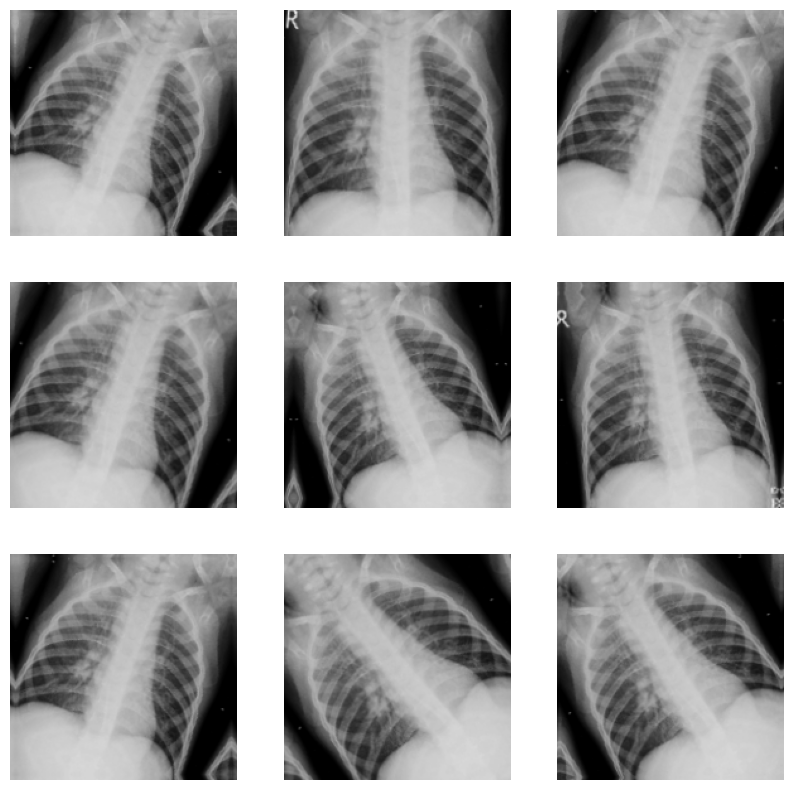

In [63]:
plt.figure(figsize=(10, 10))
for images, _ in train_ds.take(1):
  for i in range(9):
    augmented_images = data_augmentation(images)
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(augmented_images[0].numpy().astype("uint8"))
    plt.axis("off")

# Add dropout layer

In [65]:
model = Sequential([
  data_augmentation,
  layers.Rescaling(1./255,input_shape=(img_height,img_width,3)),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Dropout(0.2),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes, name="outputs")
])

In [66]:
model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['accuracy']
)

In [67]:
model.summary()

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential_3 (Sequential)       │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling_2 (Rescaling)         │ (None, 180, 180, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 180, 180, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 90, 90, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 90, 90, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 45, 45, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 45, 45, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 22, 22, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 22, 22, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 30976)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │     3,965,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ outputs (Dense)                 │ (None, 2)              │           258 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,988,898 (15.22 MB)

 Trainable params: 3,988,898 (15.22 MB)

 Non-trainable params: 0 (0.00 B)

In [68]:
epochs = 10
history=model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=epochs
)

Epoch 1/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - accuracy: 0.7115 - loss: 0.6354 - val_accuracy: 0.6875 - val_loss: 0.5631
Epoch 2/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - accuracy: 0.8854 - loss: 0.2780 - val_accuracy: 0.6875 - val_loss: 0.5984
Epoch 3/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - accuracy: 0.9156 - loss: 0.2260 - val_accuracy: 0.6875 - val_loss: 0.5024
Epoch 4/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - accuracy: 0.9275 - loss: 0.1867 - val_accuracy: 0.5625 - val_loss: 1.7032
Epoch 5/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - accuracy: 0.9129 - loss: 0.2075 - val_accuracy: 0.9375 - val_loss: 0.3442
Epoch 6/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - accuracy: 0.9263 - loss: 0.1730 - val_accuracy: 0.8125 - val_loss: 0.4078
Epoch 7/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - accuracy: 0.9374 - loss: 0.1522 - val_accuracy: 0.6875 - val_loss: 0.7188
Epoch 8/10
163/163 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - accuracy: 0.9513 - loss: 0.1371 - val_acc

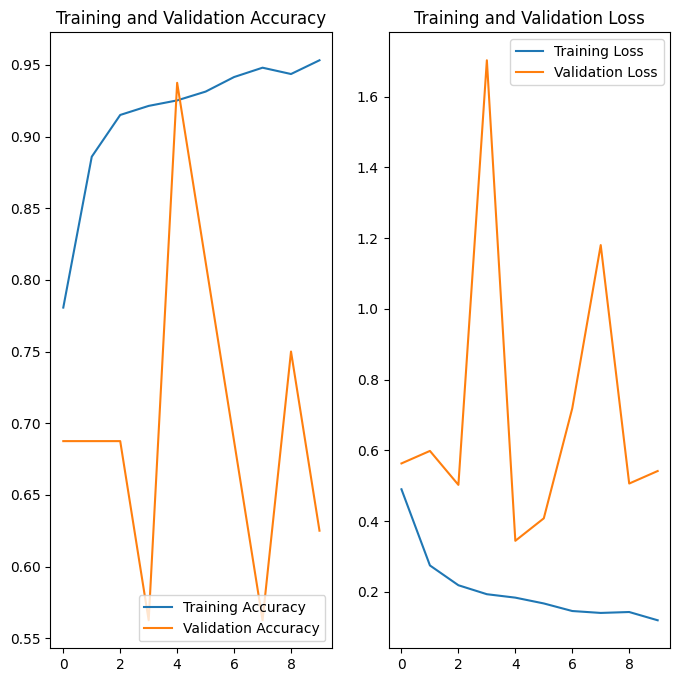

In [75]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.savefig("results/plots/accuracy_data_augmentation.png")
plt.show()

In [70]:
import numpy as np
y_true = []
y_pred = []
for images,labels in test_ds:
  logits = model.predict(images)
  preds = np.argmax(logits,axis=1)
  y_true.extend(labels.numpy())
  y_pred.extend(preds)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step


In [71]:
from sklearn.metrics import confusion_matrix, classification_report

print(confusion_matrix(y_true, y_pred))
print(classification_report(y_true, y_pred, target_names=class_names))


[[153  81]
 [  6 384]]
              precision    recall  f1-score   support

      NORMAL       0.96      0.65      0.78       234
   PNEUMONIA       0.83      0.98      0.90       390

    accuracy                           0.86       624
   macro avg       0.89      0.82      0.84       624
weighted avg       0.88      0.86      0.85       624



“Regularization through data augmentation and dropout significantly improved generalization, especially for the minority class (NORMAL), while maintaining high sensitivity for pneumonia detection.”